In [1]:
import os

# Change to the parent directory
os.chdir('../..')

# Verify the path using getcwd()
cwd = os.getcwd()
print("Current working directory:", cwd)

Current working directory: c:\Users\onyer\OneDrive\Desktop\Research work\Battery_Analysis1


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from src.file_loader import load_mpr

import src.sysid_util as sid
import os
import re
import scipy as sp
import control as ct

Columns: Index(['flags', 'Ns', 'time/s', 'control/mA', 'Ewe/V', 'I/mA', 'dQ/C',
       '(Q-Qo)/C', 'half cycle', 'Q charge/discharge/mA.h', 'I Range'],
      dtype='object')
Row count: 33941


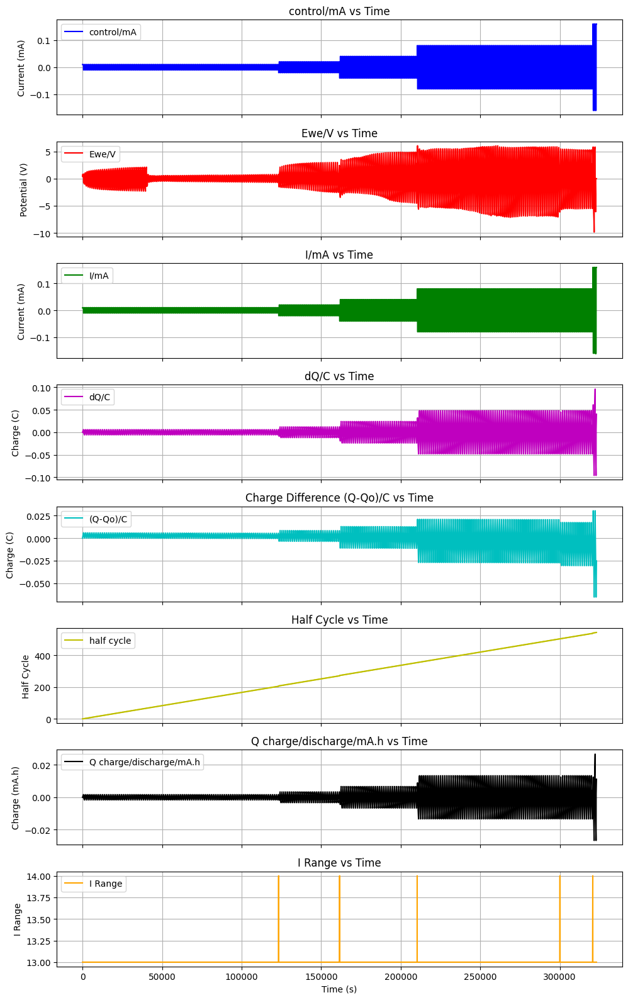

In [3]:
# Load data
mpr_file4 = load_mpr("12to1-25%CNC-3%GQDs _C01.mpr")
df4 = pd.DataFrame(mpr_file4.data)

# Get columns
print("Columns:", df4.columns)

# Get data count
print("Row count:", df4.shape[0])

# df4 = df4[df4['time/s'] <= 1000]

# Plotting
fig, ax = plt.subplots(8, 1, figsize=(10, 16), sharex=True)

# Plot each feature
ax[0].plot(df4['time/s'], df4['control/mA'], label='control/mA', color='b')
ax[1].plot(df4['time/s'], df4['Ewe/V'], label='Ewe/V', color='r')
ax[2].plot(df4['time/s'], df4['I/mA'], label='I/mA', color='g')
ax[3].plot(df4['time/s'], df4['dQ/C'], label='dQ/C', color='m')
ax[4].plot(df4['time/s'], df4['(Q-Qo)/C'], label='(Q-Qo)/C', color='c')
ax[5].plot(df4['time/s'], df4['half cycle'], label='half cycle', color='y')
ax[6].plot(df4['time/s'], df4['Q charge/discharge/mA.h'], label='Q charge/discharge/mA.h', color='k')
ax[7].plot(df4['time/s'], df4['I Range'], label='I Range', color='orange')

# Adding title and labels
ax[0].set_title('control/mA vs Time')
ax[0].set_ylabel('Current (mA)')
ax[0].legend()
ax[0].grid(True)

ax[1].set_title('Ewe/V vs Time')
ax[1].set_ylabel('Potential (V)')
ax[1].legend()
ax[1].grid(True)

ax[2].set_title('I/mA vs Time')
ax[2].set_ylabel('Current (mA)')
ax[2].legend()
ax[2].grid(True)

ax[3].set_title('dQ/C vs Time')
ax[3].set_ylabel('Charge (C)')
ax[3].legend()
ax[3].grid(True)

ax[4].set_title('Charge Difference (Q-Qo)/C vs Time')
ax[4].set_ylabel('Charge (C)')
ax[4].legend()
ax[4].grid(True)

ax[5].set_title('Half Cycle vs Time')
ax[5].set_ylabel('Half Cycle')
ax[5].legend()
ax[5].grid(True)

ax[6].set_title('Q charge/discharge/mA.h vs Time')
ax[6].set_ylabel('Charge (mA.h)')
ax[6].legend()
ax[6].grid(True)

ax[7].set_title('I Range vs Time')
ax[7].set_ylabel('I Range')
ax[7].set_xlabel('Time (s)')
ax[7].legend()
ax[7].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()

plt.show()


In [6]:
print(df4['control/mA'].unique())

[ 0.01 -0.01  0.   -0.02  0.02 -0.04  0.04  0.08 -0.08  0.16 -0.16]


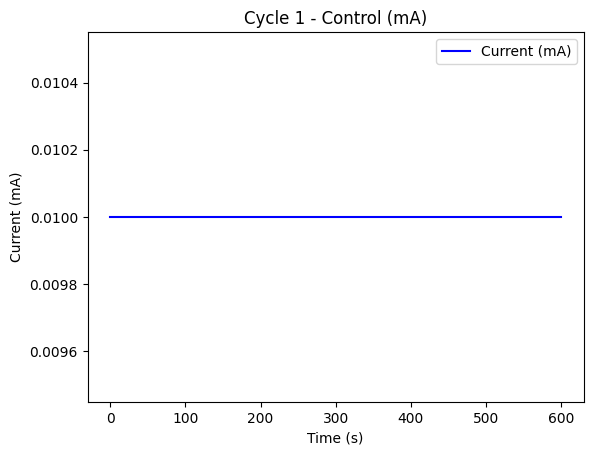

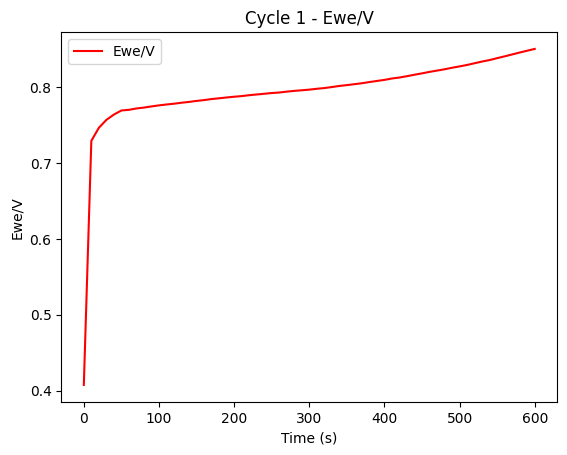

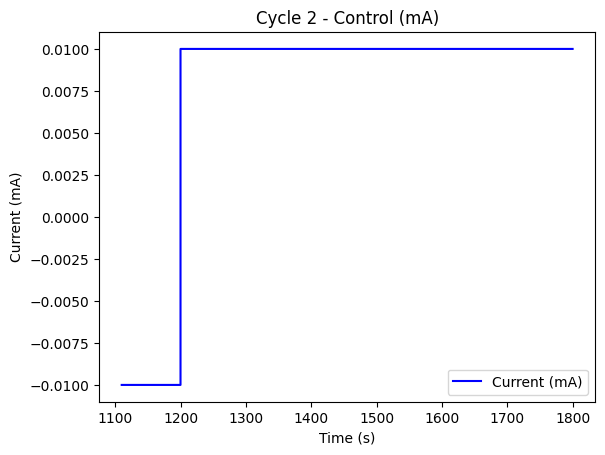

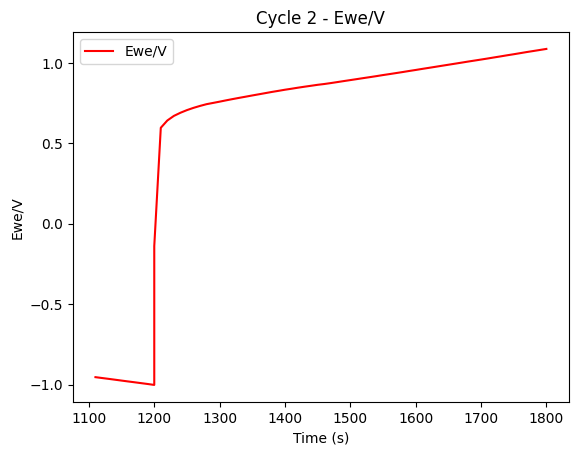

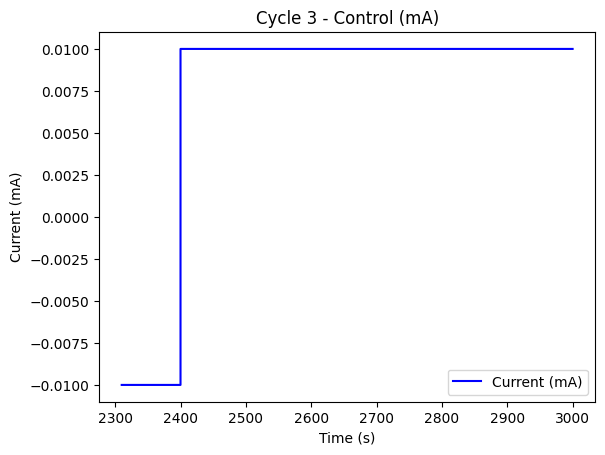

...

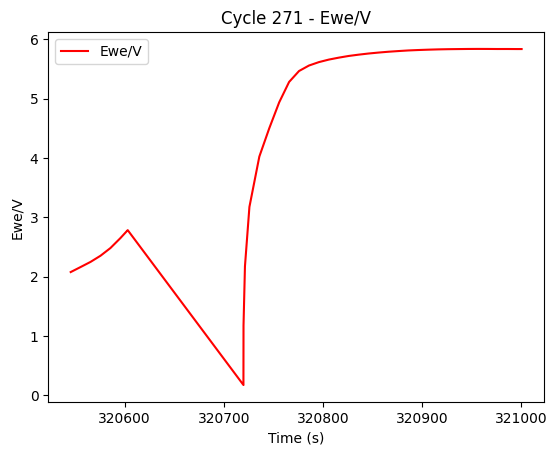

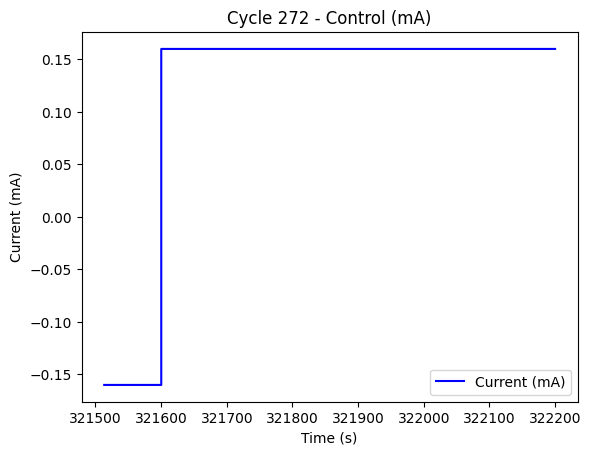

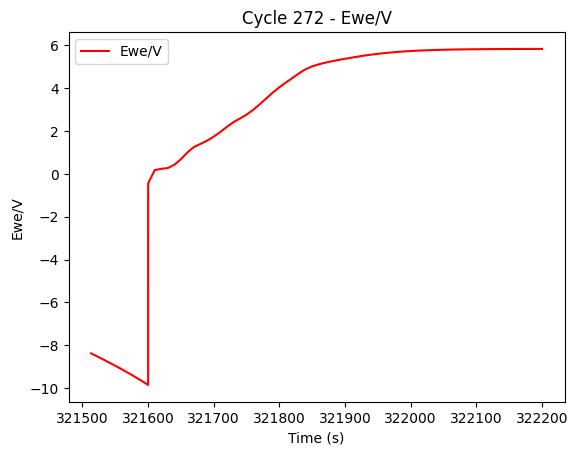

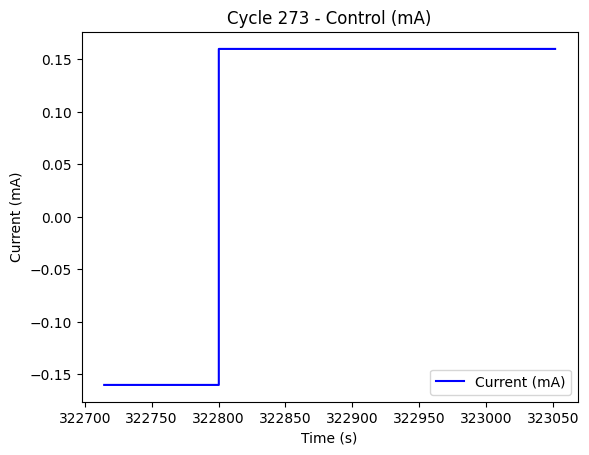

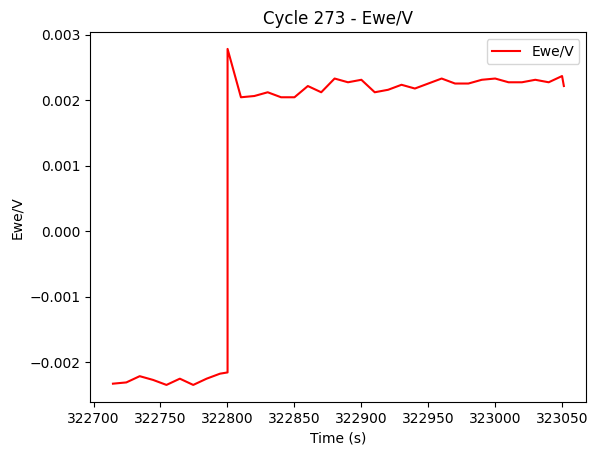

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def find_charging_cycles(df):
    cycles = []
    current_cycle = []
    i = 0
    while i < len(df):
        control_value = df.loc[i, 'control/mA']
        if control_value > 0:
            # Find the start of the cycle (including 10 points from the previous negative part)
            start = max(0, i-10)
            jj = start
            while jj < i:
                current_cycle.append(df.iloc[jj])
                jj+=1
            while i < len(df) and df.loc[i, 'control/mA'] > 0:
                current_cycle.append(df.iloc[i])
                i += 1
            # End of the cycle, add it to cycles list
            cycles.append(pd.DataFrame(current_cycle))
            current_cycle = []
        else:
            i += 1
    return cycles

# Function to visualize the cycles
def plot_cycles(cycles):
    for idx, cycle in enumerate(cycles):
        # Plot control/mA in one graph
        plt.figure()
        plt.plot(cycle['time/s'], cycle['control/mA'], 'b-', label='Current (mA)')
        plt.xlabel('Time (s)')
        plt.ylabel('Current (mA)')
        plt.title(f'Cycle {idx+1} - Control (mA)')
        plt.legend()
        plt.show()

        # Plot Ewe/V in a separate graph
        plt.figure()
        plt.plot(cycle['time/s'], cycle['Ewe/V'], 'r-', label='Ewe/V')
        plt.xlabel('Time (s)')
        plt.ylabel('Ewe/V')
        plt.title(f'Cycle {idx+1} - Ewe/V')
        plt.legend()
        plt.show()

# Assuming df4 is your DataFrame
cycles = find_charging_cycles(df4)

# Plot the cycles
plot_cycles(cycles)


In [49]:
df4.columns

Index(['flags', 'Ns', 'time/s', 'control/mA', 'Ewe/V', 'I/mA', 'dQ/C',
       '(Q-Qo)/C', 'half cycle', 'Q charge/discharge/mA.h', 'I Range'],
      dtype='object')

In [11]:
time_col = 'time/s'
value_col = 'Ewe/V'

df4_processed = df4[['time/s', 'Ewe/V']]

input_col = 'control/mA'
df4_input = df4[['time/s', 'control/mA']]

print("df4:", df4_processed)
charging_cycles = identify_charging_cycles(df4_processed, time_col, value_col)
tt, yy = list(zip(*charging_cycles))

# Inspect the contents of yy
print("yy:", yy)
# Inspect the contents of yy
print("tt:", tt)
# Helper function to check if a value is numeric
def is_float(value):
    try:
        float(value)
        return True
    except ValueError:
        return False

# Ensure yy contains only numeric data
yy = [float(val) for val in yy if is_float(val)]

# Check if yy is empty after filtering
if len(yy) == 0:
    print("No numeric values found in yy.")
else:
    # Convert yy to a numpy array
    # yy = np.array(yy, dtype=float)

    uu = np.ones(len(yy))
    uu = np.concatenate((np.zeros(10), uu))
    yy = np.concatenate((yy[0] * np.ones(10), yy))
    yy = yy - yy[0] * np.ones(len(yy))

    # Print the result to verify
    print("Processed yy:", yy)
    print("Processed uu:", uu)

df4:           time/s     Ewe/V
118  1170.000370 -0.984971
119  1180.000370 -0.990314
120  1190.000370 -0.995638
121  1200.000370 -1.001325
122  1200.000770 -0.138770
..           ...       ...
177  1750.000756  1.053178
178  1760.000756  1.059971
179  1770.000755  1.066860
180  1780.000755  1.073234
181  1790.000755  1.079703

[64 rows x 2 columns]
yy: (np.float32(-0.9849713), np.float32(-0.9903144), np.float32(-0.9956385), np.float32(-1.0013251), np.float32(-0.13876997), np.float32(0.5963375), np.float32(0.64160174), np.float32(0.67001593), np.float32(0.6895948), np.float32(0.7060822), np.float32(0.71999353), np.float32(0.7321111), np.float32(0.742931), np.float32(0.75071675), np.float32(0.7585979), np.float32(0.7668607), np.float32(0.77470374), np.float32(0.7822986), np.float32(0.78960735), np.float32(0.79710686), np.float32(0.8043392), np.float32(0.8116479), np.float32(0.8190138), np.float32(0.8257309), np.float32(0.8327152), np.float32(0.838898), np.float32(0.84546244), np.float32

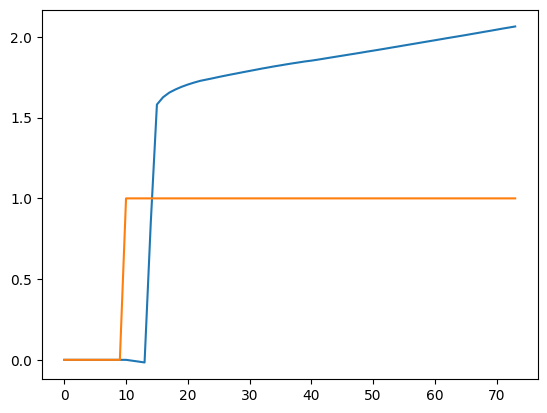

In [12]:
fig,ax = plt.subplots(1)
ax.plot(yy)
ax.plot(uu)

In [13]:
nf = 3
nb = 3
nc = 0
nd = 0
na = nf
nk = 4
   
n_arx = [nf, nb, nk]
theta_arx = sid.V_arx_lin_reg(n_arx,yy,uu)

theta_box_jenkins = np.concatenate((theta_arx[n_arx[0]:np.sum(n_arx)],np.zeros(nc+nd),theta_arx[0:n_arx[0]])) 
n_bj = [nb, nc, nd, nf, nk]

optimization_results = sp.optimize.least_squares(sid.V_box_jenkins, theta_box_jenkins, jac=sid.jac_V_bj, args=(n_bj,yy,uu))

In [14]:
print(optimization_results)

     message: `ftol` termination condition is satisfied.
     success: True
      status: 2
         fun: [ 0.000e+00  0.000e+00 ...  6.086e-03  6.944e-03]
           x: [ 8.462e-01 -9.205e-02 -7.369e-01 -9.736e-01 -8.516e-02
                6.456e-02]
        cost: 0.001168016383435558
         jac: [[ 0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
               [ 0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
               ...
               [-5.198e+01 -5.124e+01 ...  9.382e+01  9.225e+01]
               [-5.271e+01 -5.198e+01 ...  9.540e+01  9.382e+01]]
        grad: [-6.061e-12 -5.650e-12 -5.962e-12  3.491e-08 -3.206e-08
               -4.255e-08]
  optimality: 4.254637242517845e-08
 active_mask: [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00
                0.000e+00]
        nfev: 12
        njev: 11


<TransferFunction>: sys[637]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


    0.8462 z^3 - 0.09205 z^2 - 0.7369 z
--------------------------------------------
z^7 - 0.9736 z^6 - 0.08516 z^5 + 0.06456 z^4

dt = 0.005

[ 0.98917446+0.j -0.88039465+0.j  0.        +0.j]
[ 0.99394804+0.j -0.26523233+0.j  0.24490985+0.j  0.        +0.j
  0.        +0.j  0.        +0.j  0.        +0.j]


Text(0, 0.5, 'Voltage')

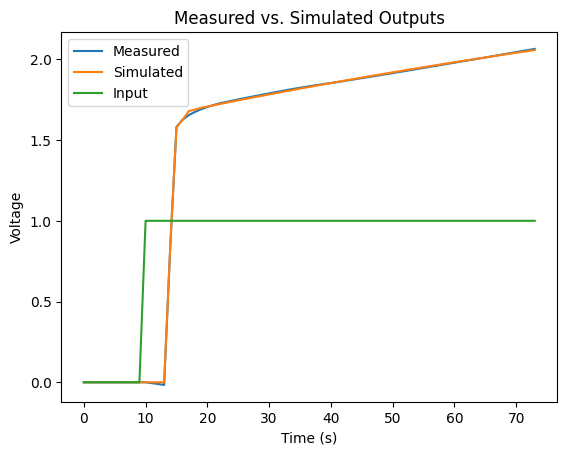

In [15]:
Ts = 0.005
G_hat_box_jenkins,H_hat_box_jenkins=sid.theta_2_tf_box_jenkins(optimization_results.x,n_bj,Ts)

print(G_hat_box_jenkins)

print(G_hat_box_jenkins.zeros())
print(G_hat_box_jenkins.poles())

tt, y_sim = ct.forced_response(G_hat_box_jenkins,U=uu)
fig,ax = plt.subplots(1)
ax.plot(yy,label='Measured')
ax.plot(y_sim,label='Simulated')
ax.plot(uu,label='Input')
ax.legend()
ax.set_title('Measured vs. Simulated Outputs')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Voltage')

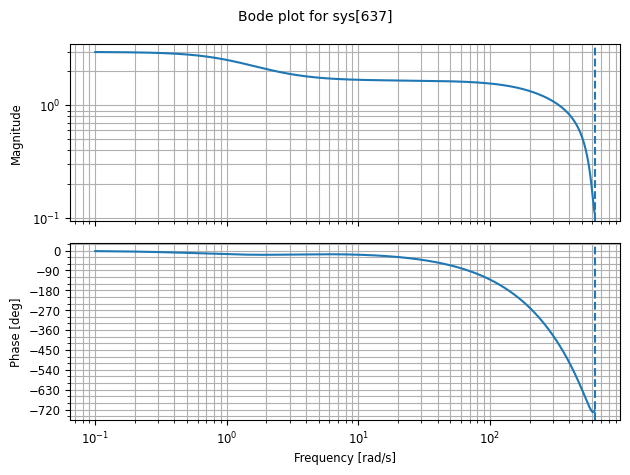

In [16]:
out=ct.bode_plot(G_hat_box_jenkins)

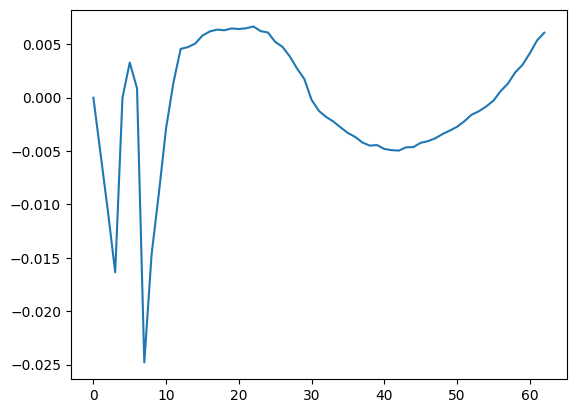

In [17]:
t0 = 10
epsilon = yy[t0:-1] - y_sim[t0:-1]
fig,ax = plt.subplots(1)
ax.plot(epsilon)


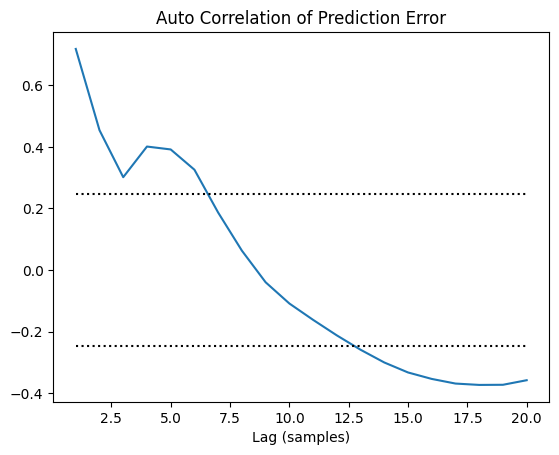

In [18]:
sid.auto_correlation_test(epsilon,tau=20)

In [19]:
from src.model import arx_model

In [20]:
start_time = pd.to_datetime('15:00:30.000', format='%H:%M:%S.%f')
end_time = pd.to_datetime('15:02:30.000', format='%H:%M:%S.%f')

# Filter the DataFrame
filtered_df2 = merged_df[(merged_df['Time (HH:mm:ss.SSS)'] >= start_time) & (merged_df['Time (HH:mm:ss.SSS)'] <= end_time)]

filtered_df2 = filtered_df2.dropna(subset=['V', 'A'])


# Further filter the DataFrame to include only rows where 'A' is 6.752
# filtered_df2 = filtered_df2[filtered_df2['A'] == 6.752]

# Calculate the time difference between consecutive points and store in deltaT
filtered_df2['deltaT'] = filtered_df2['Time (HH:mm:ss.SSS)'].diff().dt.total_seconds()

# Plot the filtered data
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(10, 8))

ax1.scatter(filtered_df2['Time (HH:mm:ss.SSS)'], filtered_df2['V'])
ax1.set_ylabel('V')

ax2.scatter(filtered_df2['Time (HH:mm:ss.SSS)'], filtered_df2['A'])
ax2.set_ylabel('A')
ax2.legend(['A'])

ax3.scatter(filtered_df2['Time (HH:mm:ss.SSS)'], filtered_df2['deltaT'], marker='o')
ax3.set_ylabel('deltaT (seconds)')
ax3.set_xlabel('Time (HH:mm:ss.SSS)')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"V data has {len(filtered_df2['V'])} data points.")

# Check if all deltaT values are the same
all_same = filtered_df2['deltaT'].dropna().nunique() == 1
print(f"All deltaT values are the same: {all_same}")

# Use voltage (V) as the output and current (A) as the input
u = filtered_df2['A'].values 
y = filtered_df2['V'].values
order = 2  # Specify the order of the system


# Perform discrete time system identification
theta, Phi, Y = arx_model(u, y, order)
print("Estimated parameters (theta):", theta)
print("Phi matrix:", Phi)
print("Y vector:", Y)

# Use the identified parameters to predict and plot
y_pred = Phi @ theta

# Plot the original and predicted values
plt.figure(figsize=(10, 5))
plt.plot(filtered_df2['Time (HH:mm:ss.SSS)'][order:], y[order:], label='Original')
plt.plot(filtered_df2['Time (HH:mm:ss.SSS)'][order:], y_pred, label='Predicted', linestyle='--')
plt.xlabel('Time (HH:mm:ss.SSS)')
plt.ylabel('Voltage (V)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


NameError: name 'merged_df' is not defined